# IMPORING PYTHON LIBRARY

In [ ]:
import numpy as np, pandas as pd
from glob import glob
import shutil, os
import matplotlib.pyplot as plt
from sklearn.model_selection import GroupKFold
from tqdm.notebook import tqdm
import seaborn as sns

In [4]:
#representing the diemnsionality of the data 
dim = 512 #512, 256, 'original'
fold = 4

In [5]:
#reading a csv file  with file name includig dim to indicate the size of the image dataset
train_df = pd.read_csv(f'../input/vinbigdata-{dim}-image-dataset/vinbigdata/train.csv')
train_df.head()

,image_id,class_name,class_id,rad_id,x_min,y_min,x_max,y_max,width,height
0,50a418190bc3fb1ef1633bf9678929b3,No finding,14,R11,NaN,NaN,NaN,NaN,2332,2580
1,21a10246a5ec7af151081d0cd6d65dc9,No finding,14,R7,NaN,NaN,NaN,NaN,2954,3159
2,9a5094b2563a1ef3ff50dc5c7ff71345,Cardiomegaly,3,R10,691.0,1375.0,1653.0,1831.0,2080,2336
3,051132a778e61a86eb147c7c6f564dfe,Aortic enlargement,0,R10,1264.0,743.0,1611.0,1019.0,2304,2880
4,063319de25ce7edb9b1c6b8881290140,No finding,14,R10,NaN,NaN,NaN,NaN,2540,3072


In [6]:
#file path constructed using string concatenation , including the value of dim 
train_df['image_path'] = f'/kaggle/input/vinbigdata-{dim}-image-dataset/vinbigdata/train/'+train_df.image_id+('.png' if dim!='original' else '.jpg')
train_df.head()

,image_id,class_name,class_id,rad_id,x_min,y_min,x_max,y_max,width,height,image_path
0,50a418190bc3fb1ef1633bf9678929b3,No finding,14,R11,NaN,NaN,NaN,NaN,2332,2580,/kaggle/input/vinbigdata-512-image-dataset/vin...
1,21a10246a5ec7af151081d0cd6d65dc9,No finding,14,R7,NaN,NaN,NaN,NaN,2954,3159,/kaggle/input/vinbigdata-512-image-dataset/vin...
2,9a5094b2563a1ef3ff50dc5c7ff71345,Cardiomegaly,3,R10,691.0,1375.0,1653.0,1831.0,2080,2336,/kaggle/input/vinbigdata-512-image-dataset/vin...
3,051132a778e61a86eb147c7c6f564dfe,Aortic enlargement,0,R10,1264.0,743.0,1611.0,1019.0,2304,2880,/kaggle/input/vinbigdata-512-image-dataset/vin...
4,063319de25ce7edb9b1c6b8881290140,No finding,14,R10,NaN,NaN,NaN,NaN,2540,3072,/kaggle/input/vinbigdata-512-image-dataset/vin...


# LOCALIZATION FOR ONLY TOP 14 CLASSES

In [7]:
#dataframe to remove any rows ensuring the indices of the remaining rows where the class_id has a value of 14 are consecutive integers integers start from 0
train_df = train_df[train_df.class_id!=14].reset_index(drop = True)

# DATA PREPROCESSING

In [8]:
#Calculating additional coloumns in the DataFrame to provide information about the bounding boxes associated with each abnormility in the images.
train_df['x_min'] = train_df.apply(lambda row: (row.x_min)/row.width, axis =1)
train_df['y_min'] = train_df.apply(lambda row: (row.y_min)/row.height, axis =1)

train_df['x_max'] = train_df.apply(lambda row: (row.x_max)/row.width, axis =1)
train_df['y_max'] = train_df.apply(lambda row: (row.y_max)/row.height, axis =1)

train_df['x_mid'] = train_df.apply(lambda row: (row.x_max+row.x_min)/2, axis =1)
train_df['y_mid'] = train_df.apply(lambda row: (row.y_max+row.y_min)/2, axis =1)

train_df['w'] = train_df.apply(lambda row: (row.x_max-row.x_min), axis =1)
train_df['h'] = train_df.apply(lambda row: (row.y_max-row.y_min), axis =1)

train_df['area'] = train_df['w']*train_df['h']
train_df.head()

,image_id,class_name,class_id,rad_id,x_min,y_min,x_max,y_max,width,height,image_path,x_mid,y_mid,w,h,area
0,9a5094b2563a1ef3ff50dc5c7ff71345,Cardiomegaly,3,R10,0.332212,0.588613,0.794712,0.783818,2080,2336,/kaggle/input/vinbigdata-512-image-dataset/vin...,0.563462,0.686216,0.462500,0.195205,0.090283
1,051132a778e61a86eb147c7c6f564dfe,Aortic enlargement,0,R10,0.548611,0.257986,0.699219,0.353819,2304,2880,/kaggle/input/vinbigdata-512-image-dataset/vin...,0.623915,0.305903,0.150608,0.095833,0.014433
2,1c32170b4af4ce1a3030eb8167753b06,Pleural thickening,11,R9,0.246850,0.116211,0.372835,0.140951,2540,3072,/kaggle/input/vinbigdata-512-image-dataset/vin...,0.309843,0.128581,0.125984,0.024740,0.003117
3,0c7a38f293d5f5e4846aa4ca6db4daf1,ILD,5,R17,0.589497,0.095890,0.957549,0.848924,2285,2555,/kaggle/input/vinbigdata-512-image-dataset/vin...,0.773523,0.472407,0.368053,0.753033,0.277156
4,47ed17dcb2cbeec15182ed335a8b5a9e,Nodule/Mass,8,R9,0.216900,0.701461,0.262850,0.740829,2568,3353,/kaggle/input/vinbigdata-512-image-dataset/vin...,0.239875,0.721145,0.045950,0.039368,0.001809


In [9]:
#defining the matrix and the target for training the model 
features = ['x_min', 'y_min', 'x_max', 'y_max', 'x_mid', 'y_mid', 'w', 'h', 'area']
X = train_df[features]
y = train_df['class_id']
X.shape, y.shape

((36096, 9), (36096,))

In [10]:
#defining liat of class names and a corresponding list of class IDs based on the unique values 
class_ids, class_names = list(zip(*set(zip(train_df.class_id, train_df.class_name))))
classes = list(np.array(class_names)[np.argsort(class_ids)])
classes = list(map(lambda x: str(x), classes))
classes

['Aortic enlargement',
 'Atelectasis',
 'Calcification',
 'Cardiomegaly',
 'Consolidation',
 'ILD',
 'Infiltration',
 'Lung Opacity',
 'Nodule/Mass',
 'Other lesion',
 'Pleural effusion',
 'Pleural thickening',
 'Pneumothorax',
 'Pulmonary fibrosis']

# REDUCING DIMENSIONALITY BY t-SNE VISUALIZATION

In [12]:
%%time
from sklearn.manifold import TSNE

tsne = TSNE(n_components = 2, perplexity = 40, random_state=1, n_iter=500)
data_X = X
data_y = y.loc[data_X.index]
embs = tsne.fit_transform(data_X)
# Add to dataframe for convenience
plot_x = embs[:, 0]
plot_y = embs[:, 1]

CPU times: user 5min 31s, sys: 9.55 s, total: 5min 41s
Wall time: 3min 2s


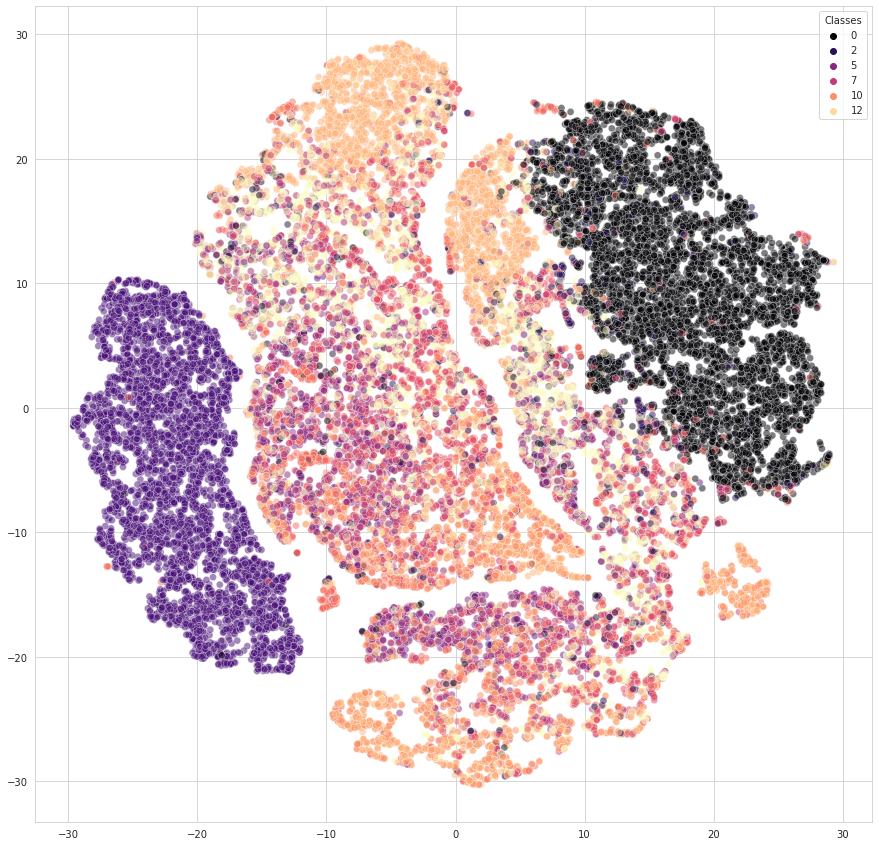

In [13]:
# scatter.get_legend_handles_labels() function to get the handles and labels for the legend from the scatter plot 
plt.figure(figsize=(15,15))
sns.set_style("whitegrid")
scatter = sns.scatterplot(x=plot_x, y=plot_y, hue=data_y.tolist(), palette='magma', s=50, alpha=0.5)

# Get the handles and labels for the legend
handles, labels = scatter.get_legend_handles_labels()

# Create a legend from the handles and labels
legend = plt.legend(handles=handles, labels=labels, loc='best', title='Classes')

plt.show()

# BOUNDING BOX (BBox) LOCATION

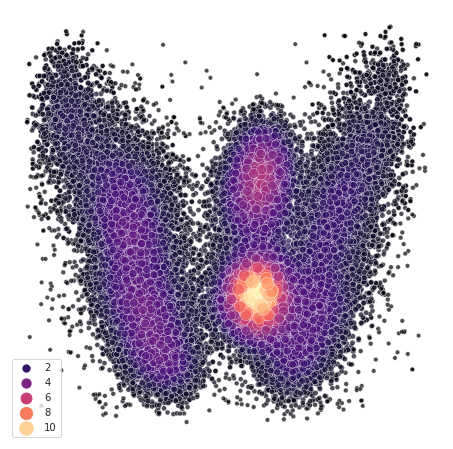

In [14]:
#x_mid Vs y_mid 
#gaussian_kde to calculate the point density 
from scipy.stats import gaussian_kde

x_val = train_df.x_mid.values
y_val = train_df.y_mid.values

# Calculate the point density
xy = np.vstack([x_val,y_val])
z = gaussian_kde(xy)(xy)#calculating the kernel density at each location in the xy array

fig, ax = plt.subplots(figsize=(8, 8))
sns.scatterplot(x=x_val, y=y_val, hue=z, size=z, sizes=(20, 200),
                palette='magma', alpha=0.7, ax=ax)
ax.set(xlabel='x_mid', ylabel='y_mid', aspect='equal')
ax.axis('off')
plt.show()

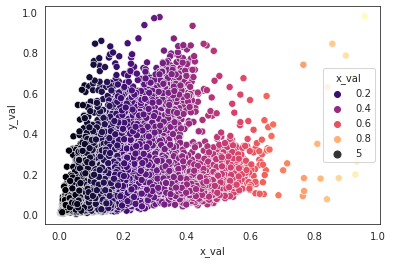

In [15]:
#bbox_w Vs bbox_h
x_val = train_df.w.values
y_val = train_df.h.values

df = pd.DataFrame({'x_val': x_val, 'y_val': y_val})
sns.set_style('white')
#sns.kdeplot(data=df, x='x_val', y='y_val', cmap='viridis', shade=True, alpha=0.5, shade_lowest=False)
sns.scatterplot(data=df, x='x_val', y='y_val', hue='x_val', size=5, sizes=(50, 200), palette='magma')

plt.show()

# IMAGE ASPECT RATIO

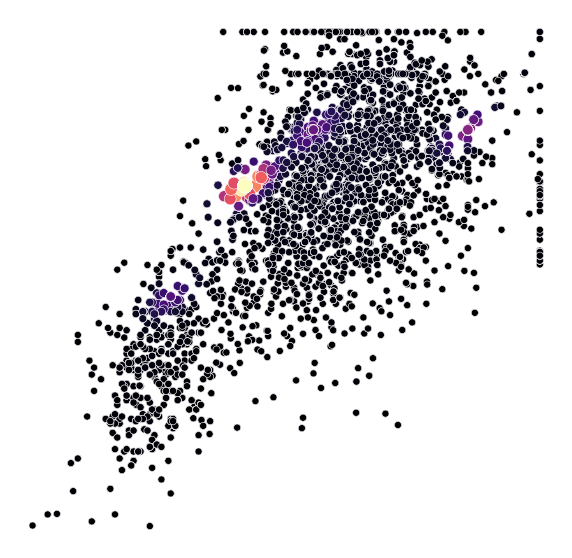

In [16]:
#create a scatter plot with the density estimate 
x_val = train_df.width.values
y_val = train_df.height.values

# Calculate the point density
xy = np.vstack([x_val,y_val])
z = gaussian_kde(xy)(xy)#gaussian_kde() function to calculate the kernel density 

fig, ax = plt.subplots(figsize = (10, 10))
ax.axis('off')
sns.scatterplot(x=x_val, y=y_val, hue=z, size=z, sizes=(50, 200), legend=False, palette='magma')
# ax.set_xlabel('image_width')
# ax.set_ylabel('image_height')
plt.show()

# SPLITTING

In [17]:
#cross validation on the training dataset 
gkf  = GroupKFold(n_splits = 5) #groups with related samples
train_df['fold'] = -1
for fold, (train_idx, val_idx) in enumerate(gkf.split(train_df, groups = train_df.image_id.tolist())):
    train_df.loc[val_idx, 'fold'] = fold
train_df.head()

,image_id,class_name,class_id,rad_id,x_min,y_min,x_max,y_max,width,height,image_path,x_mid,y_mid,w,h,area,fold
0,9a5094b2563a1ef3ff50dc5c7ff71345,Cardiomegaly,3,R10,0.332212,0.588613,0.794712,0.783818,2080,2336,/kaggle/input/vinbigdata-512-image-dataset/vin...,0.563462,0.686216,0.462500,0.195205,0.090283,3
1,051132a778e61a86eb147c7c6f564dfe,Aortic enlargement,0,R10,0.548611,0.257986,0.699219,0.353819,2304,2880,/kaggle/input/vinbigdata-512-image-dataset/vin...,0.623915,0.305903,0.150608,0.095833,0.014433,2
2,1c32170b4af4ce1a3030eb8167753b06,Pleural thickening,11,R9,0.246850,0.116211,0.372835,0.140951,2540,3072,/kaggle/input/vinbigdata-512-image-dataset/vin...,0.309843,0.128581,0.125984,0.024740,0.003117,4
3,0c7a38f293d5f5e4846aa4ca6db4daf1,ILD,5,R17,0.589497,0.095890,0.957549,0.848924,2285,2555,/kaggle/input/vinbigdata-512-image-dataset/vin...,0.773523,0.472407,0.368053,0.753033,0.277156,2
4,47ed17dcb2cbeec15182ed335a8b5a9e,Nodule/Mass,8,R9,0.216900,0.701461,0.262850,0.740829,2568,3353,/kaggle/input/vinbigdata-512-image-dataset/vin...,0.239875,0.721145,0.045950,0.039368,0.001809,4


In [18]:
#splitting the dataset into training and validation sets based on the fold column generated 
train_files = []
test_files   = []
test_files += list(train_df[train_df.fold==fold].image_path.unique())#including the unique path for all samples in the current fold 
train_files += list(train_df[train_df.fold!=fold].image_path.unique())#including the unique image paths for all samples not in the current fold 
len(train_files), len(test_files)

(3515, 879)

# COPYING THE FILES

In [19]:
#creating directories for storing training and validation dataset, and to copy over the corresponding image and label files to these directories.
os.makedirs('/kaggle/working/vinbigdata/labels/train', exist_ok = True)
os.makedirs('/kaggle/working/vinbigdata/labels/val', exist_ok = True)
os.makedirs('/kaggle/working/vinbigdata/images/train', exist_ok = True)
os.makedirs('/kaggle/working/vinbigdata/images/val', exist_ok = True)
label_dir = '/kaggle/input/vinbigdata-yolo-labels-dataset/labels'
for file in tqdm(train_files):
    shutil.copy(file, '/kaggle/working/vinbigdata/images/train')
    filename = file.split('/')[-1].split('.')[0]
    shutil.copy(os.path.join(label_dir, filename+'.txt'), '/kaggle/working/vinbigdata/labels/train')
    
for file in tqdm(test_files):
    shutil.copy(file, '/kaggle/working/vinbigdata/images/val')
    filename = file.split('/')[-1].split('.')[0]
    shutil.copy(os.path.join(label_dir, filename+'.txt'), '/kaggle/working/vinbigdata/labels/val')

# GETTING THE CLASS NAME 

In [20]:
#extracting the unique class IDs  and class names from the DataFrame
class_ids, class_names = list(zip(*set(zip(train_df.class_id, train_df.class_name))))
classes = list(np.array(class_names)[np.argsort(class_ids)])
classes = list(map(lambda x: str(x), classes))
classes

['Aortic enlargement',
 'Atelectasis',
 'Calcification',
 'Cardiomegaly',
 'Consolidation',
 'ILD',
 'Infiltration',
 'Lung Opacity',
 'Nodule/Mass',
 'Other lesion',
 'Pleural effusion',
 'Pleural thickening',
 'Pneumothorax',
 'Pulmonary fibrosis']

# SETTING UP THE DATASET FOR USE WITH YOLOv5 MODEL

In [21]:
from os import listdir
from os.path import isfile, join
import yaml

cwd = '/kaggle/working/'

with open(join( cwd , 'train.txt'), 'w') as f:
    for path in glob('/kaggle/working/vinbigdata/images/train/*'):
        f.write(path+'\n')
            
with open(join( cwd , 'val.txt'), 'w') as f:
    for path in glob('/kaggle/working/vinbigdata/images/val/*'):
        f.write(path+'\n')

data = dict(
    train =  join( cwd , 'train.txt') ,
    val   =  join( cwd , 'val.txt' ),
    nc    = 14,
    names = classes
    )

with open(join( cwd , 'vinbigdata.yaml'), 'w') as outfile:
    yaml.dump(data, outfile, default_flow_style=False)

f = open(join( cwd , 'vinbigdata.yaml'), 'r')
print('\nyaml:') #YAML file with dataset information 
print(f.read())


yaml:
names:
- Aortic enlargement
- Atelectasis
- Calcification
- Cardiomegaly
- Consolidation
- ILD
- Infiltration
- Lung Opacity
- Nodule/Mass
- Other lesion
- Pleural effusion
- Pleural thickening
- Pneumothorax
- Pulmonary fibrosis
nc: 14
train: /kaggle/working/train.txt
val: /kaggle/working/val.txt



# SETTING UP CUDA DEVICE PROPERTIES 

In [22]:
# https://www.kaggle.com/ultralytics/yolov5
# !git clone https://github.com/ultralytics/yolov5  # clone repo
# %cd yolov5
shutil.copytree('/kaggle/input/yolov5-official-v31-dataset/yolov5', '/kaggle/working/yolov5')
os.chdir('/kaggle/working/yolov5')
# %pip install -qr requirements.txt # install dependencies

import torch
from IPython.display import Image, clear_output  # to display images

clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Setup complete. Using torch 1.6.0 _CudaDeviceProperties(name='Tesla P100-PCIE-16GB', major=6, minor=0, total_memory=16280MB, multi_processor_count=56)


# TRAINING THE YOLOv5 MODEL

In [23]:
# !WANDB_MODE="dryrun" python train.py --img 640 --batch 16 --epochs 3 --data coco128.yaml --weights yolov5s.pt --nosave --cache 
!WANDB_MODE="dryrun" python train.py --img 640 --batch 16 --epochs 3 --data /kaggle/working/vinbigdata.yaml --weights yolov5x.pt --cache

100%|████████████████████████████████████████| 170M/170M [00:02<00:00, 64.7MB/s]

wandb: Offline run mode, not syncing to the cloud.
wandb: W&B is disabled in this directory.  Run `wandb on` to enable cloud syncing.
Scanning '/kaggle/working/vinbigdata/labels/train' for images and labels... 3515 found, 0 missing, 0 empty, 0 corrupted: 100%|██████████| 3515/3515 [00:02<00:00, 1638.17it/s]
Scanning '/kaggle/working/vinbigdata/labels/train.cache' for images and labels... 3515 found, 0 missing, 0 empty, 0 corrupted: 100%|██████████| 3515/3515 [00:00<00:00, 18638405.26it/s]
Caching images (4.3GB): 100%|██████████| 3515/3515 [00:13<00:00, 263.35it/s]
Scanning '/kaggle/working/vinbigdata/labels/val' for images and labels... 879 found, 0 missing, 0 empty, 0 corrupted: 100%|██████████| 879/879 [00:01<00:00, 823.01it/s] 
Scanning '/kaggle/working/vinbigdata/labels/val.cache' for images and labels... 879 found, 0 missing, 0 empty, 0 corrupted: 100%|██████████| 879/879 [00:00<00:00, 1231393.86it/s

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:21: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:22: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.


Accuracy for test_batch0: 1.0
Accuracy for test_batch1: 1.0
Accuracy for test_batch2: 1.0


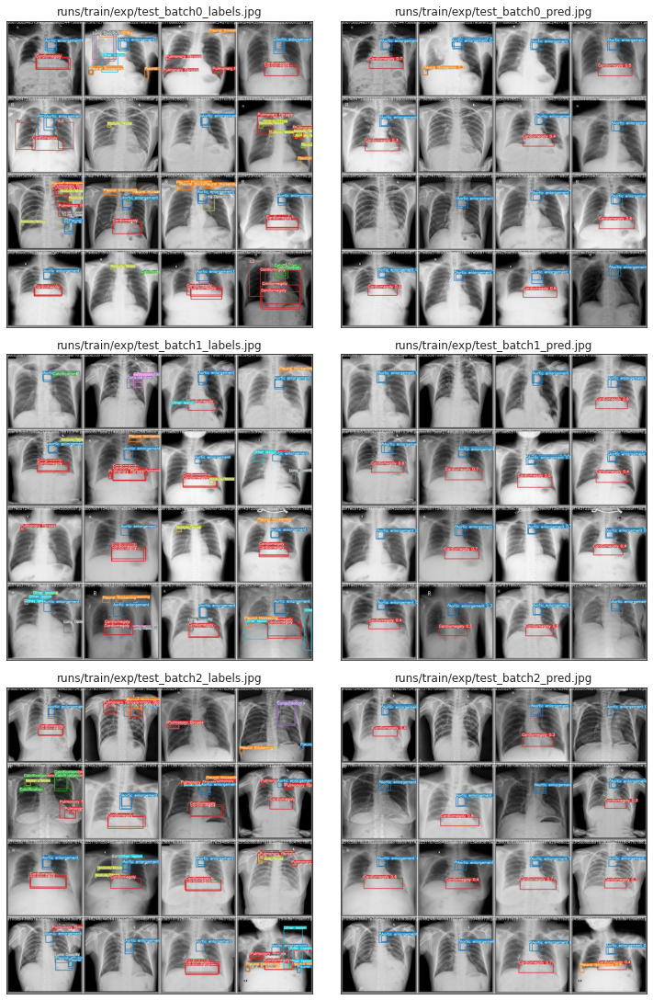

In [24]:
fig, ax = plt.subplots(3, 2, figsize = (2*5,3*5), constrained_layout = True)

for row in range(3):
    true_labels = plt.imread(f'runs/train/exp/test_batch{row}_labels.jpg')
    pred_labels = plt.imread(f'runs/train/exp/test_batch{row}_pred.jpg')

    ax[row][0].imshow(true_labels)
    ax[row][0].set_xticks([])
    ax[row][0].set_yticks([])
    ax[row][0].set_title(f'runs/train/exp/test_batch{row}_labels.jpg', fontsize = 12)

    ax[row][1].imshow(pred_labels)
    ax[row][1].set_xticks([])
    ax[row][1].set_yticks([])
    ax[row][1].set_title(f'runs/train/exp/test_batch{row}_pred.jpg', fontsize = 12)

    true_labels = true_labels.ravel()
    pred_labels = pred_labels.ravel()

    # Convert the RGB values to class labels
    true_labels = np.where(true_labels == [255, 255, 255], 1, 0)
    pred_labels = np.where(pred_labels == [255, 255, 255], 1, 0)

    # Compare the true and predicted labels
    accuracy = np.mean(true_labels == pred_labels)

    print(f"Accuracy for test_batch{row}: {accuracy}")

In [25]:
#calculating the precision , recall and f1 score 
from sklearn.metrics import precision_recall_fscore_support

true_labels = []
predicted_labels = []

for row in range(3):
    true_labels.append(plt.imread(f'runs/train/exp/test_batch{row}_labels.jpg'))
    predicted_labels.append(plt.imread(f'runs/train/exp/test_batch{row}_pred.jpg'))

true_labels = np.concatenate(true_labels)
predicted_labels = np.concatenate(predicted_labels)

precision, recall, f1, _ = precision_recall_fscore_support(true_labels.ravel(), predicted_labels.ravel())

print("Precision:", precision)
print("Recall:", recall)
print("F1 score:", f1)

Precision: [0.9854375  0.95978241 0.86193206 0.95488956 0.94620106 0.94344764
 0.94092078 0.94865302 0.93649994 0.92808068 0.92521739 0.92440982
 0.91527772 0.91749119 0.90872379 0.90840125 0.89672679 0.90009106
 0.86623841 0.866477   0.82578965 0.81894701 0.81046723 0.79516511
 0.77306262 0.75856751 0.75224338 0.74083235 0.72017285 0.71492569
 0.70655171 0.69327431 0.68308211 0.68613172 0.67839718 0.66213454
 0.65747248 0.66317773 0.64408535 0.66604083 0.6663237  0.66552901
 0.66155872 0.67348672 0.67433862 0.68253911 0.67757112 0.68207268
 0.67761119 0.68167225 0.68680801 0.70024982 0.70082248 0.71796753
 0.71762222 0.73083587 0.73262289 0.74038646 0.74402066 0.75049741
 0.75227636 0.75113039 0.75458743 0.75292433 0.75663563 0.75519258
 0.7611489  0.75899937 0.81413399 0.84468258 0.7622825  0.76748671
 0.76109189 0.75778299 0.76991788 0.77246537 0.77135541 0.77394558
 0.77593073 0.77006933 0.77579929 0.77475805 0.7755787  0.77596865
 0.77831897 0.77856028 0.77568011 0.77580955 0.7744

# CLASS DISTRIBUTION

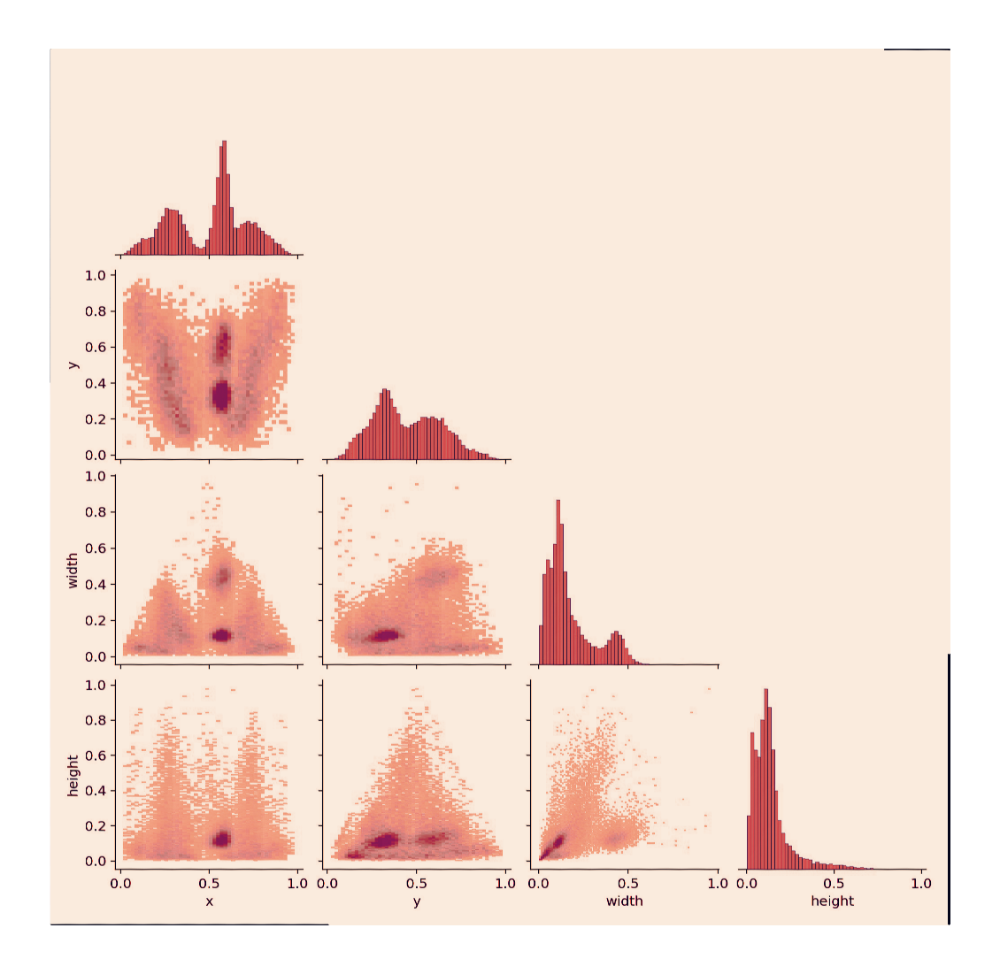

In [26]:
import matplotlib.pyplot as plt
import numpy as np
from scipy import ndimage

# Load the image
img = plt.imread('runs/train/exp/labels_correlogram.jpg')

# Rotate the image
rotated_img = ndimage.rotate(img, 270)

# Create the scatter plot
fig, ax = plt.subplots(figsize=(20, 20))
ax.axis('off')
ax.scatter(*np.indices(rotated_img.shape)[:2], c=rotated_img.reshape(-1, 3)/255.0, s=1)


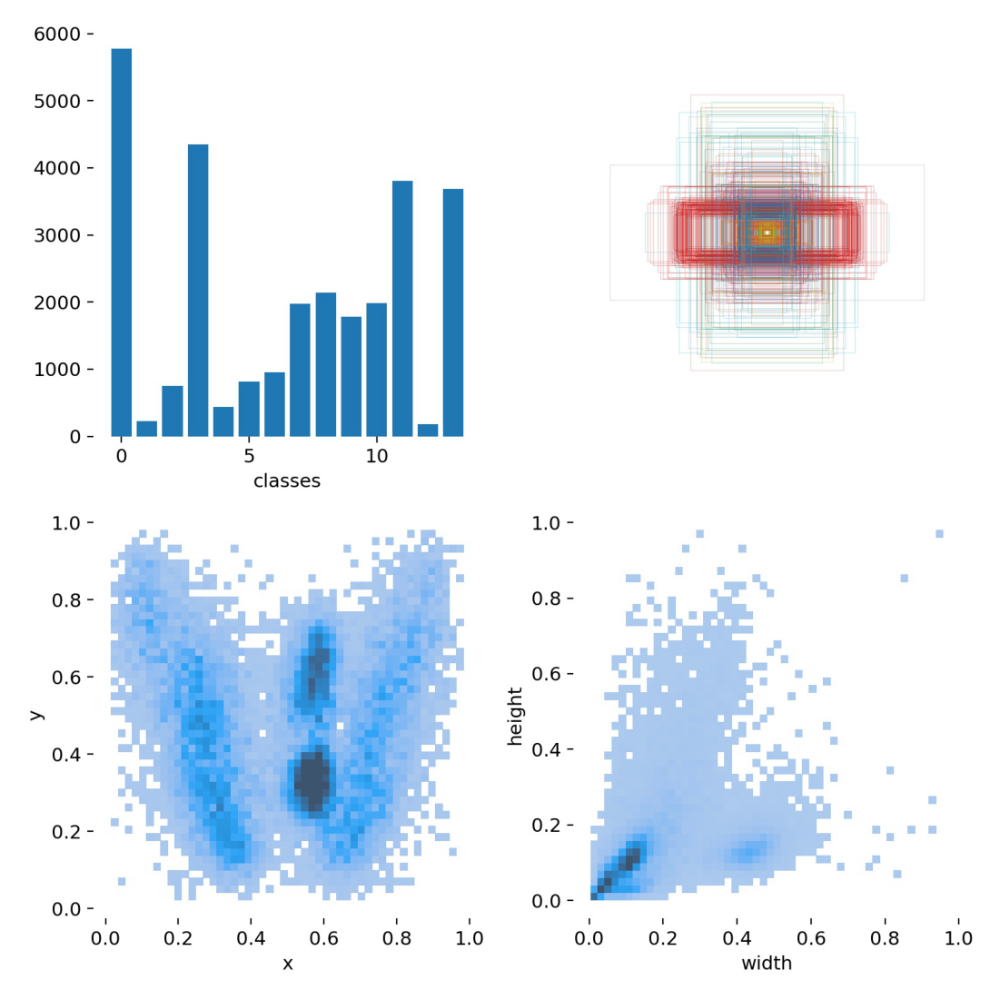

In [27]:
#plotting the number of instances for each class label in the training data 
plt.figure(figsize = (20,20))
plt.axis('off')
plt.imshow(plt.imread('runs/train/exp/labels.jpg'));

# BATCH IMAGE 

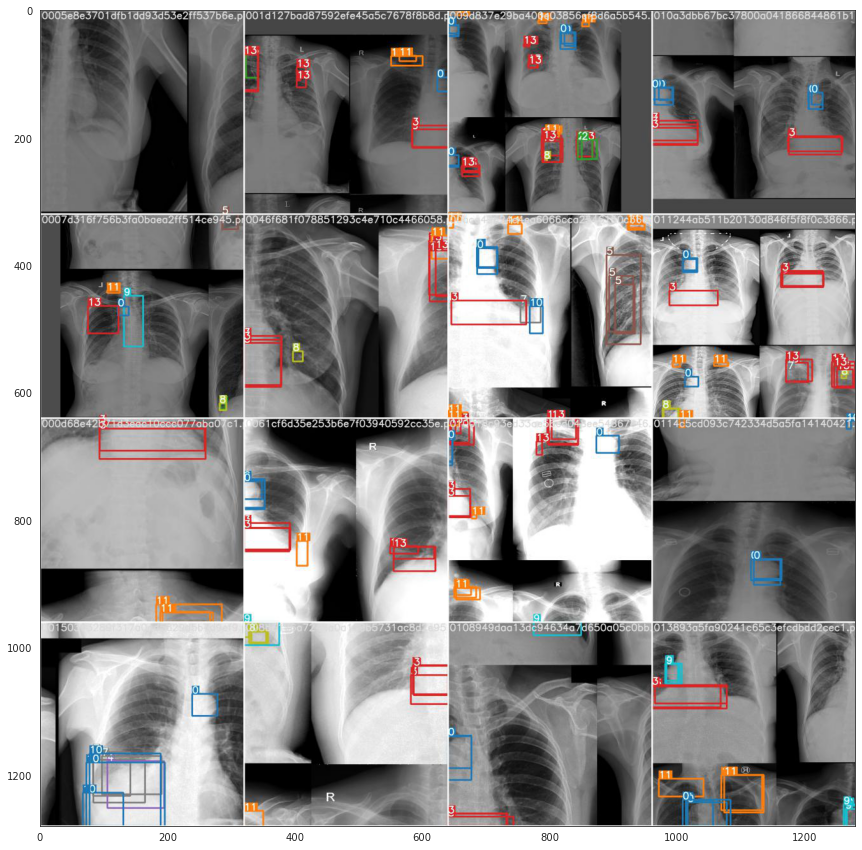

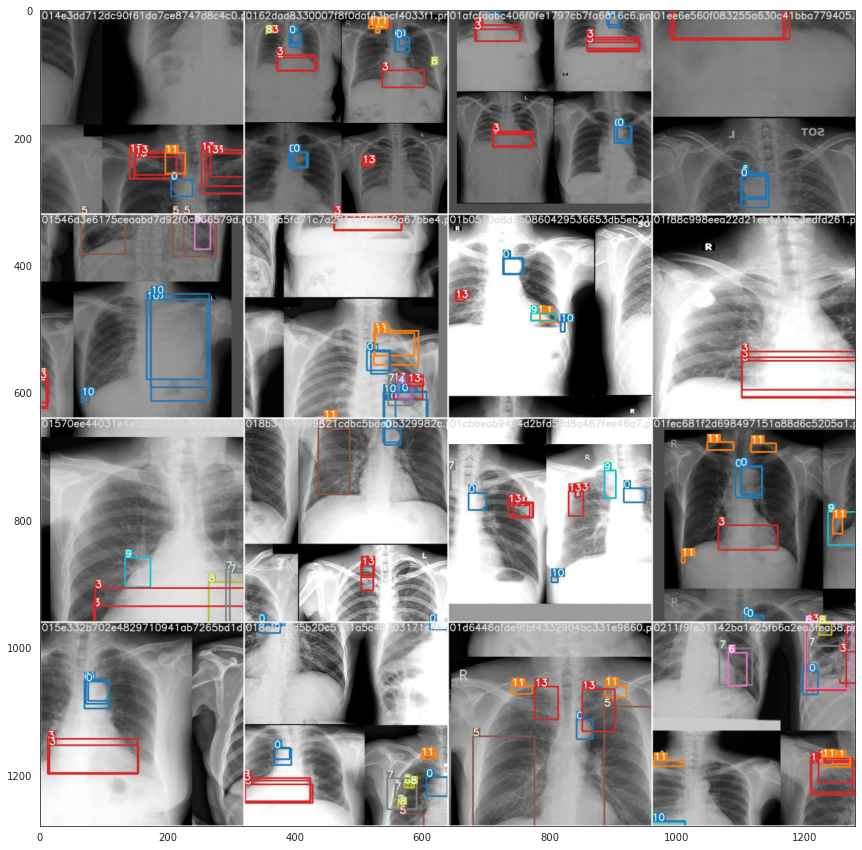

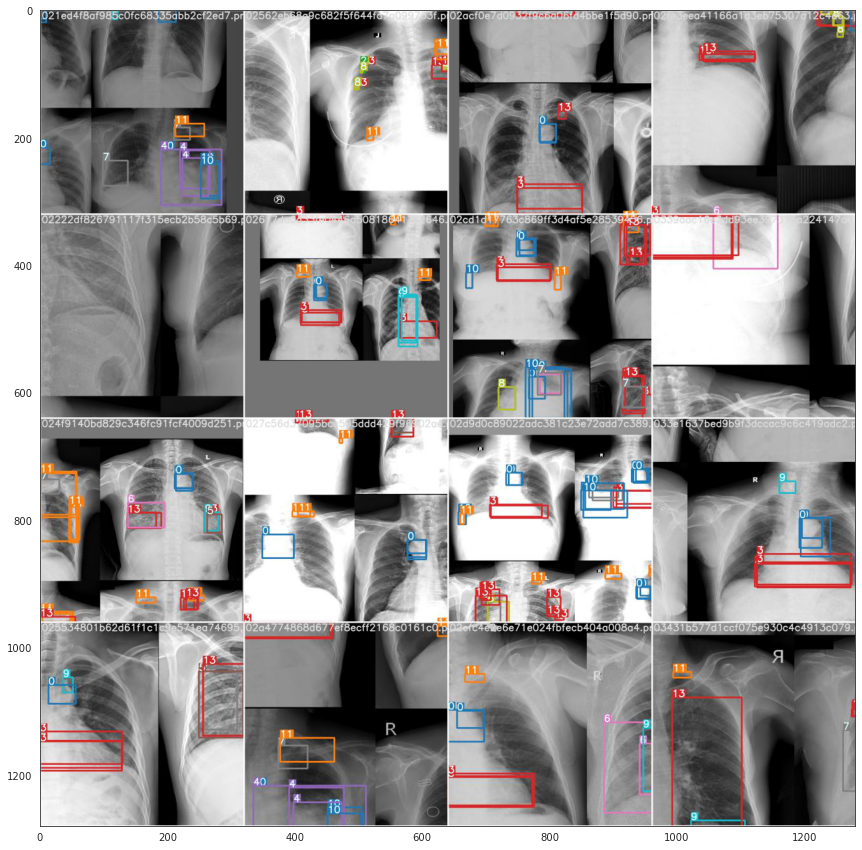

In [28]:
#visual output of the YOLOv5 model during training on different batches 
plt.figure(figsize = (15, 15))
plt.imshow(plt.imread('runs/train/exp/train_batch0.jpg'))

plt.figure(figsize = (15, 15))
plt.imshow(plt.imread('runs/train/exp/train_batch1.jpg'))

plt.figure(figsize = (15, 15))
plt.imshow(plt.imread('runs/train/exp/train_batch2.jpg'))

# GROUND TRUTH vs PREDICTION 

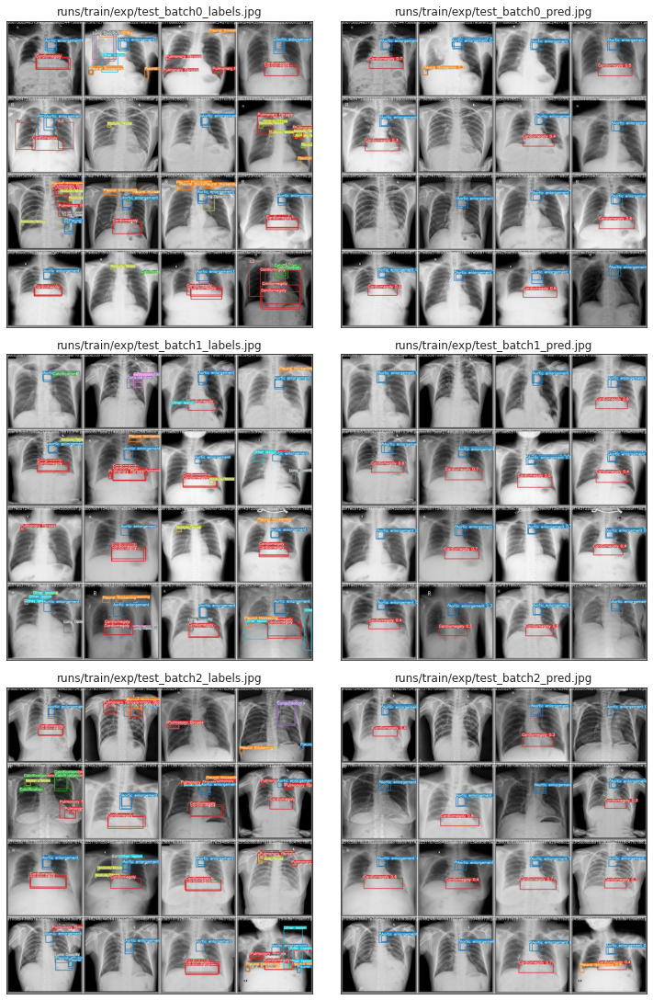

In [29]:
#path testing batch label and prediction images , generating test batch images 
fig, ax = plt.subplots(3, 2, figsize = (2*5,3*5), constrained_layout = True)
for row in range(3):
    ax[row][0].imshow(plt.imread(f'runs/train/exp/test_batch{row}_labels.jpg'))
    ax[row][0].set_xticks([])
    ax[row][0].set_yticks([])
    ax[row][0].set_title(f'runs/train/exp/test_batch{row}_labels.jpg', fontsize = 12)
    
    ax[row][1].imshow(plt.imread(f'runs/train/exp/test_batch{row}_pred.jpg'))
    ax[row][1].set_xticks([])
    ax[row][1].set_yticks([])
    ax[row][1].set_title(f'runs/train/exp/test_batch{row}_pred.jpg', fontsize = 12)

# LOSS, MEAN AVERAGE PRECISION  Vs EPOCH

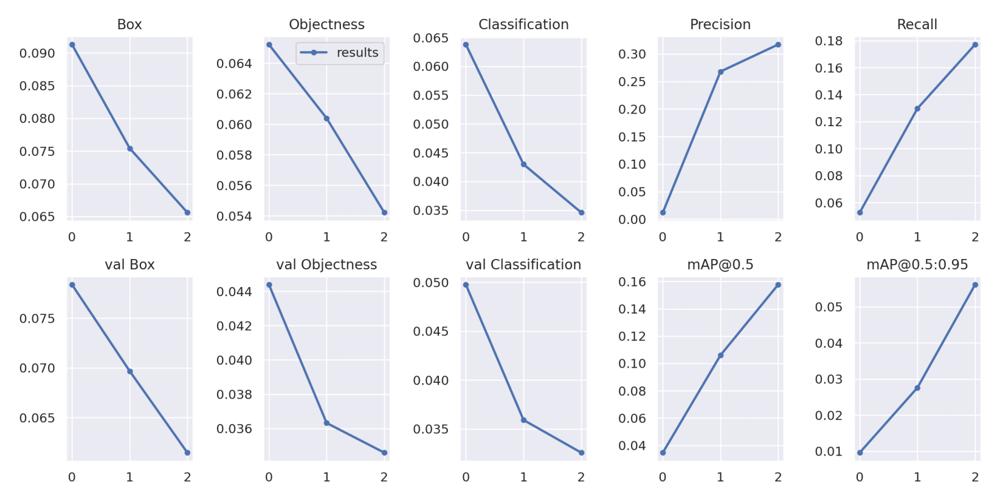

In [30]:
#producing result images that show training and validation loss and mean average precission 
plt.figure(figsize=(30,15))
plt.axis('off')
plt.imshow(plt.imread('runs/train/exp/results.png'));

# EVALUATING THE PERFORMANCE OF CLASSIFICATION OF MODEL 

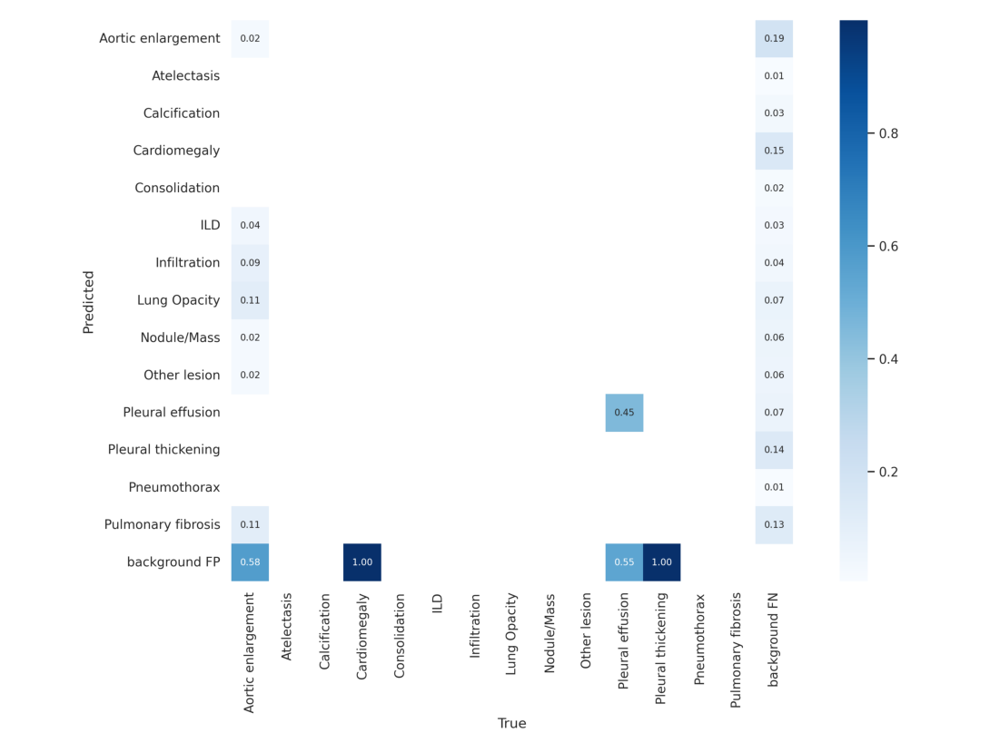

In [31]:
#displaying the number of true positives, false positives , true negatives and false negatives for each classes 
plt.figure(figsize=(30,15))
plt.axis('off')
plt.imshow(plt.imread('runs/train/exp/confusion_matrix.png'));

# DETECT OBJECTS IN IMAGES - INFERENCE

In [32]:
#specifying best weights , size of the input image , confidence threshold and intersection over union
!python detect.py --weights 'runs/train/exp/weights/best.pt'\
--img 640\
--conf 0.15\
--iou 0.5\
--source /kaggle/working/vinbigdata/images/val\
--exist-ok

Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.15, device='', exist_ok=True, img_size=640, iou_thres=0.5, name='exp', project='runs/detect', save_conf=False, save_txt=False, source='/kaggle/working/vinbigdata/images/val', update=False, view_img=False, weights=['runs/train/exp/weights/best.pt'])
Fusing layers... 
image 1/879 /kaggle/working/vinbigdata/images/val/00675cd546313f912cadd4ad54415d69.png: 640x640 2 Aortic enlargements, 1 Cardiomegalys, Done. (0.050s)
image 2/879 /kaggle/working/vinbigdata/images/val/009d4c31ebf87e51c5c8c160a4bd8006.png: 640x640 1 Aortic enlargements, 1 Pleural effusions, Done. (0.046s)
image 3/879 /kaggle/working/vinbigdata/images/val/00bcb82818ea83d6a86df241762cd7d0.png: 640x640 2 Aortic enlargements, 1 Cardiomegalys, 1 Pleural effusions, 1 Pleural thickenings, Done. (0.045s)
image 4/879 /kaggle/working/vinbigdata/images/val/00f2f97f74e086e1f82acc285ee4a5c5.png: 640x640 2 Aortic enlargements, 1 Cardiomegalys, 3 Pleural thickenings, D

# INFERENCE PLOT

100%|██████████| 16/16 [00:00<00:00, 147.49it/s]


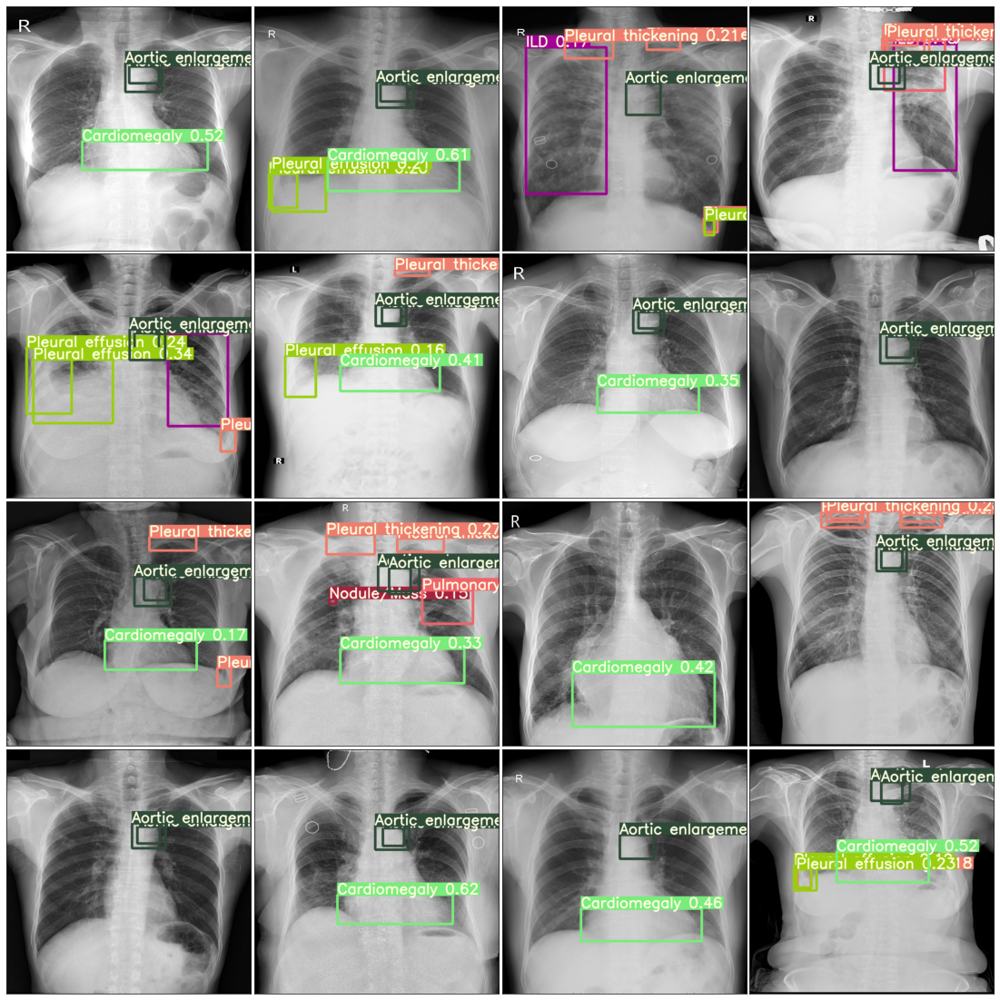

100%|██████████| 16/16 [00:00<00:00, 138.11it/s]


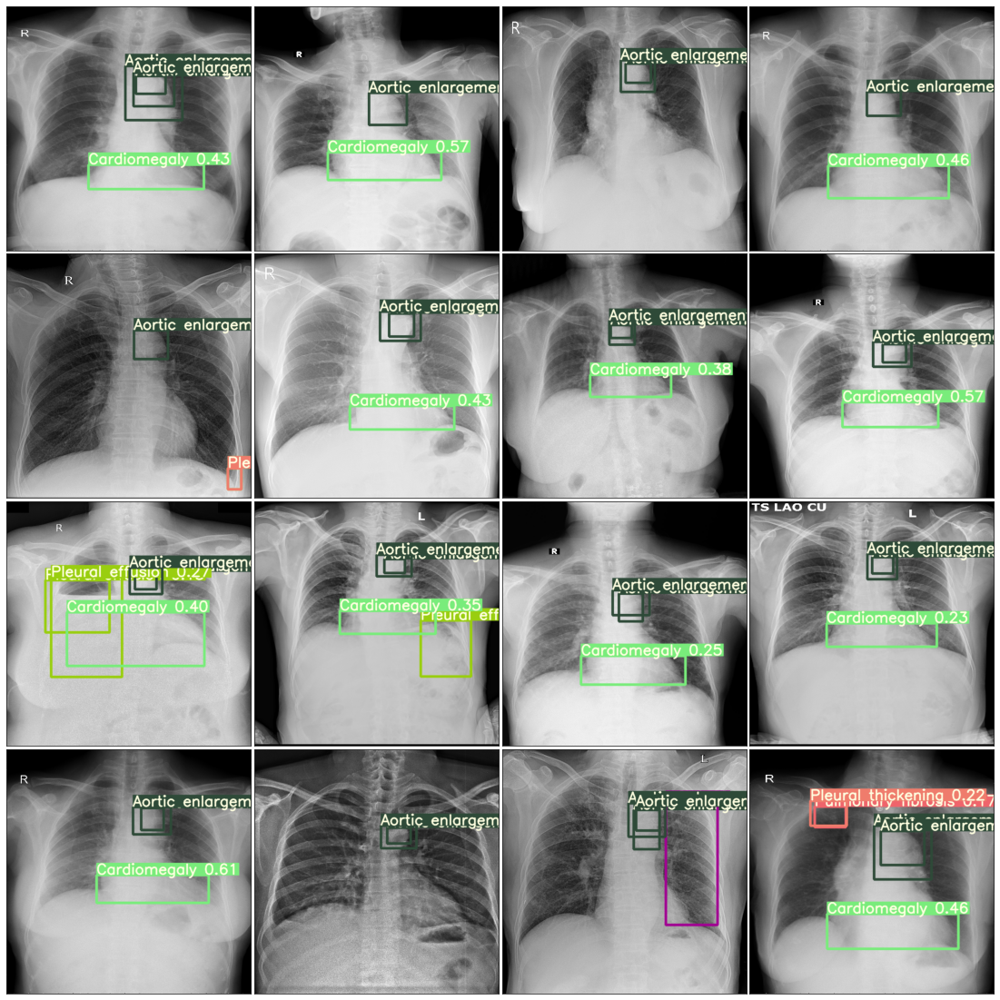

100%|██████████| 16/16 [00:00<00:00, 138.65it/s]


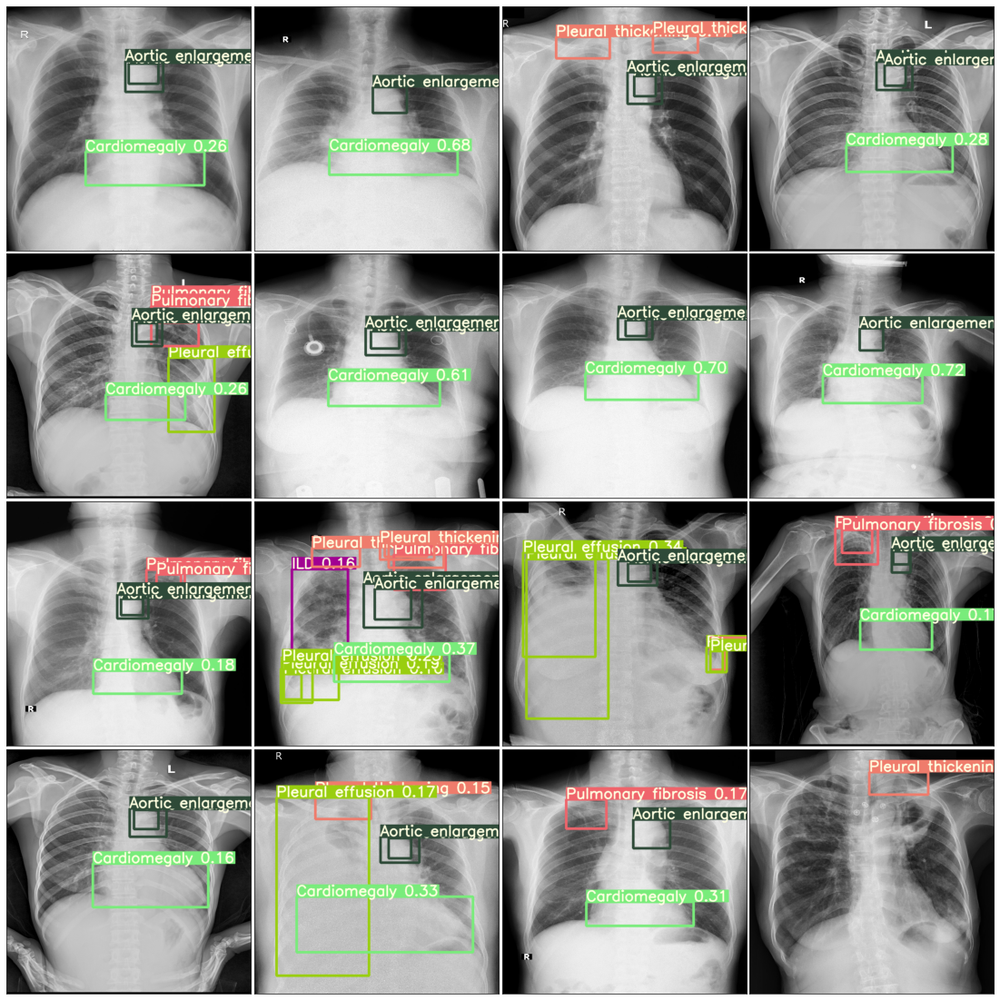

In [35]:
#Applying non-maximum suppression (NMS) to remove overlapping bounding boxes and converting the predicted bounding boxes and class probabilities back to the original image size and format
#Saving the predicted bounding boxes and class probabilities as images with colored bounding boxes and class labels.

import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid
import numpy as np
import random
import cv2
from glob import glob
from tqdm import tqdm

files = glob('runs/detect/exp/*')
for _ in range(3):
    row = 4
    col = 4
    grid_files = random.sample(files, row*col)
    images     = []
    for image_path in tqdm(grid_files):
        img          = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
        images.append(img)

    fig = plt.figure(figsize=(col*5, row*5))
    grid = ImageGrid(fig, 111,  # similar to subplot(111)
                     nrows_ncols=(col, row),  # creates 2x2 grid of axes
                     axes_pad=0.05,  # pad between axes in inch.
                     )

    for ax, im in zip(grid, images):
        # Iterating over the grid returns the Axes.
        ax.imshow(im)
        ax.set_xticks([])
        ax.set_yticks([])
    plt.show()